<a href="https://colab.research.google.com/github/fnsalamaa/FINA-SALAMA-PCVK/blob/main/Week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**✩˚｡⋆ WEEK 11 PCVK ✩˚｡⋆**

### Name : Fina Salama Qowlam Hareny

#### No    : 08 / 2141720164

####Class : TI-3I

----
##**⋰˚☆ ENGLISH MODULE 11 ⋰˚☆**
###**Object Detection Methods: Template Matching, Edge Detection, Corner Detection, Grid Detection, Contour Detection**


**1. Import some libraries and access the folders on your Drive as follows.**

In [39]:
from google.colab import drive

# Acessing Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Import necessary libraries
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

**2. Implement 6 template matching methods in OpenCV using the cats_and_bunnies.jpg
and cat2_templatejpg.jpg images as templates.**

Matching Templates

a. Using the openCV library:

cv.matchTemplate(), with parameters
- image: input image
- templ: the template to search for, the size cannot be larger than the input image
- method: method of template matching

b. Types of template matching methods in OpenCV:
1. TM SQDIFF
2. TM SQDIFF NORMED
3. TM_CCORR
4. TM_CCORR NORMED
5. TM. CCOEFF
6. TM CCOEFF NORMED

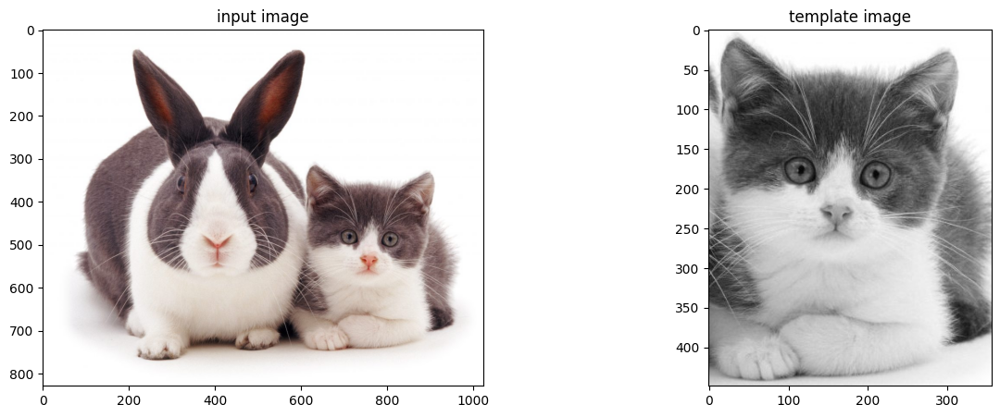

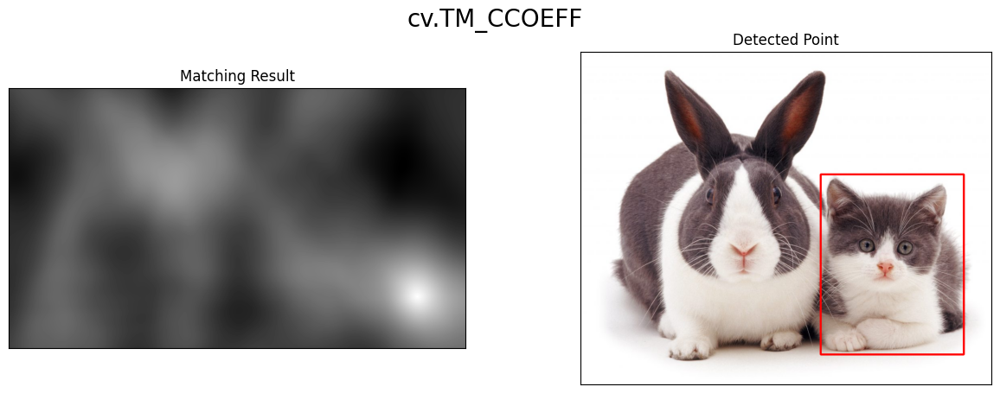

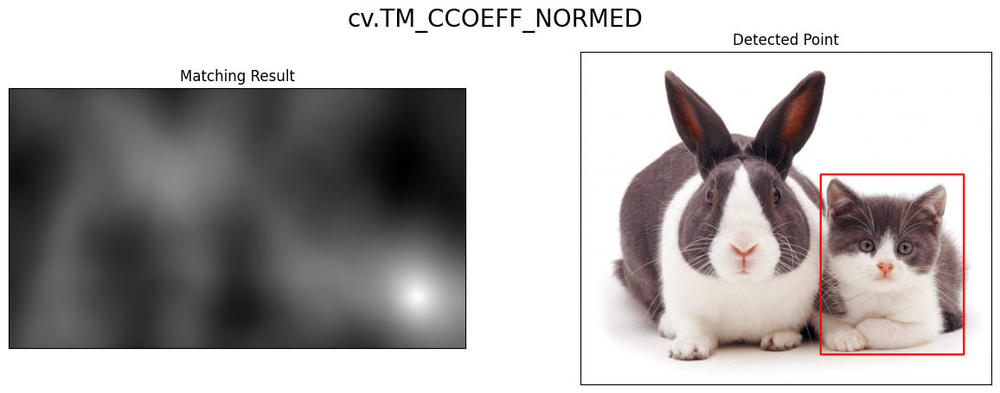

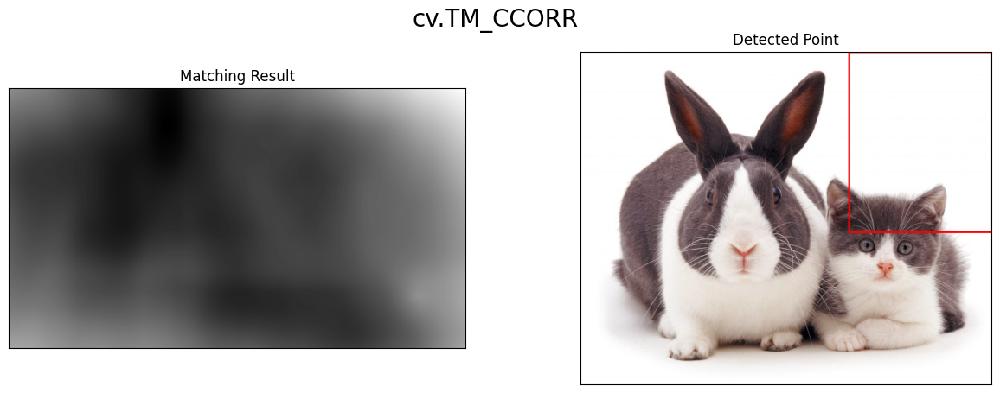

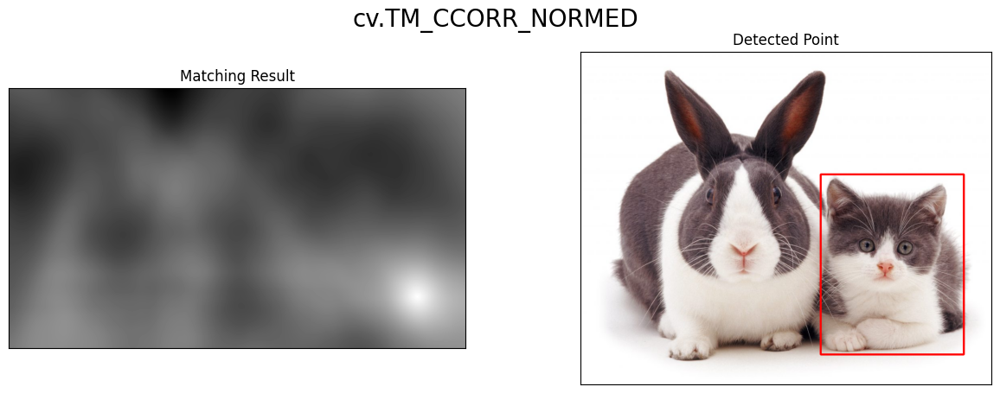

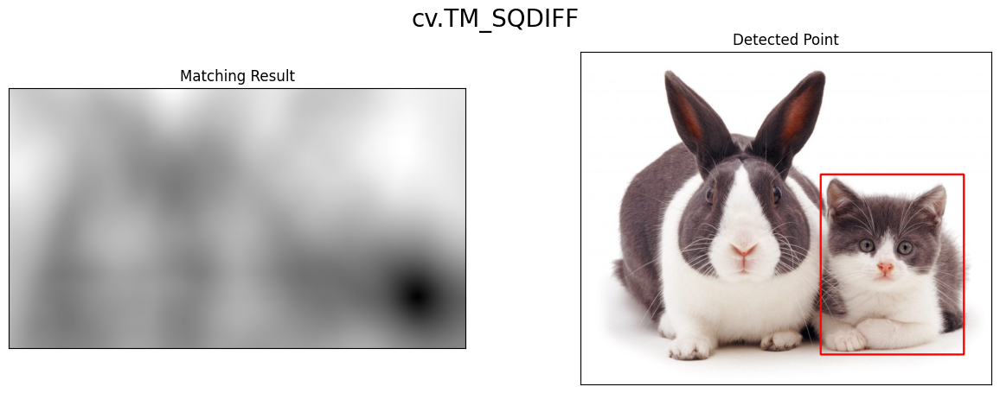

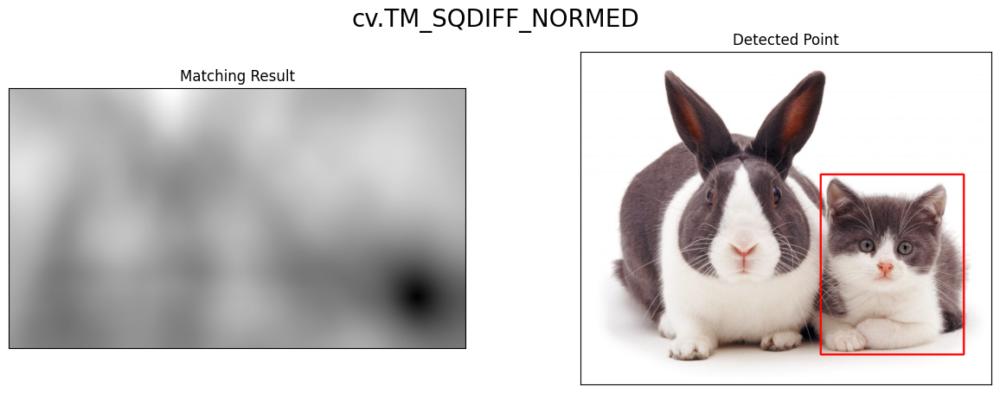

In [ ]:
# Load input image
img = cv.imread('/content/drive/MyDrive/PCVK/cats_and_bunnies.jpg')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img2 = img.copy()

# Load template image
template = cv.imread('/content/drive/MyDrive/PCVK/cat2_templatejpg.jpg',0)

# Image dimensions
w, h = template.shape[::-1]

# Create 2 plots for input image and template
f, axarr = plt. subplots(1,2,figsize=(15,5)) #
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), axarr[0].set_title("input image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("template image")

# All the 6 methods for comparison in a list
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

for meth in methods:
    img = img2.copy()
    method = eval(meth)
    # Apply template Matching
    res = cv.matchTemplate(img_gray,template,method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv.rectangle(img,top_left, bottom_right,(0,0,255),3)
    plt.figure(figsize=(15,5))
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    print("\n\n")
    plt.suptitle(meth, fontsize=20)
    plt.show()

**3. Implement the Sobel Edge Detection, Canny Edge Detection, and Laplacian Edge
Detection methods in OpenCV using the parking-lot-cars.jpg image, resulting in the
following output:**

**a. Sobel Edge Detection**

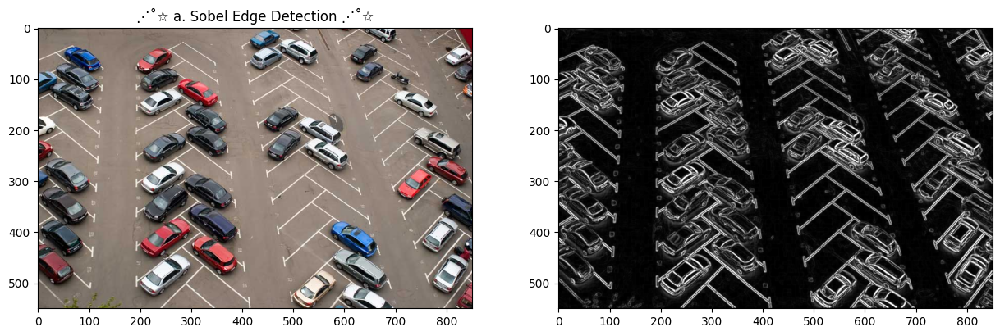

In [ ]:
# Read the image
original_image = cv.imread('/content/drive/MyDrive/PCVK/parking-lot-cars.jpg')

# converting to gray scale
gray = cv.cvtColor(original_image, cv.COLOR_BGR2GRAY)

# remove noise
img = cv.GaussianBlur(gray, (3, 3), 0)

# obtaining a horizontal and vertical Sobel filtering of the image
img_sobelx = cv.Sobel(img, cv.CV_64F, 1, 0, ksize=3)
img_sobely = cv.Sobel(img, cv.CV_64F, 0, 1, ksize=3)

# image with both horizontal and vertical Sobel kernels applied
img_sobelxy = cv.addWeighted(cv.convertScaleAbs(img_sobelx), 0.5, cv.convertScaleAbs(img_sobely), 0.5, 0)

f, axarr = plt.subplots(1, 2, figsize=(15, 5))
plt.subplot(121), plt.imshow(cv.cvtColor(original_image, cv.COLOR_BGR2RGB))
axarr[0].imshow(cv.cvtColor(original_image, cv.COLOR_BGR2RGB))
axarr[0].set_title('⋰˚☆ a. Sobel Edge Detection ⋰˚☆')
plt.subplot(122), plt.imshow(img_sobelxy, cmap='gray')
axarr[1].imshow(cv.cvtColor(img_sobelxy, cv.COLOR_BGR2RGB))

**b. Canny Edge Detection**

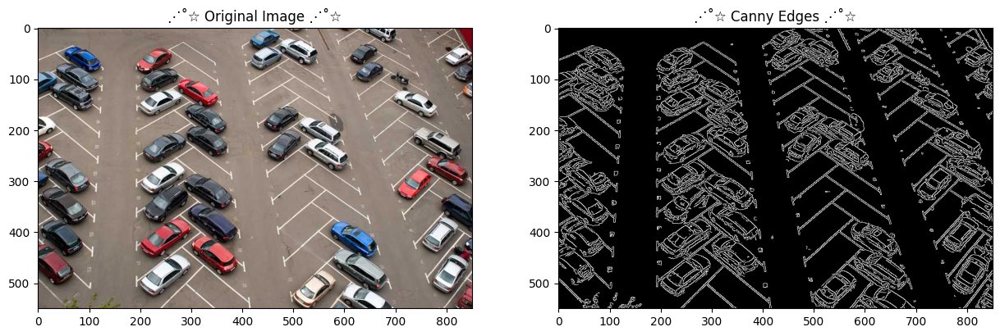

In [ ]:
# Read the image from the specified path
img = cv.imread('/content/drive/MyDrive/PCVK/parking-lot-cars.jpg')

# Apply Canny edge detection with lower and upper thresholds of 100 and 200
edges = cv.Canny(img, 100, 200)

# Create a subplot with 1 row and 2 columns, setting the figure size
f, axarr = plt.subplots(1, 2, figsize=(15, 5))

# Plot the original image in the first subplot (left)
plt.subplot(121), plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('⋰˚☆ Original Image ⋰˚☆')  # Add a title to the subplot

# Plot the edges in the second subplot (right)
plt.subplot(122), plt.imshow(edges, cmap='gray')
axarr[1].imshow(edges, cmap='gray')
plt.title('⋰˚☆ Canny Edges ⋰˚☆')  # Add a title to the subplot

# Display the entire figure with both subplots
plt.show()


**c. Laplacian Edge Detection**

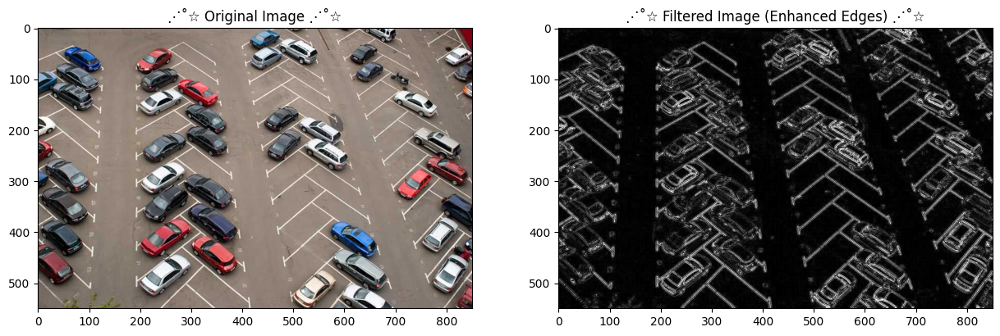

In [ ]:
# Read the original image in color (BGR format)
image_original = cv.imread('/content/drive/MyDrive/PCVK/parking-lot-cars.jpg', cv.IMREAD_COLOR)

# Convert the original image to grayscale
image_gray = cv.cvtColor(image_original, cv.COLOR_BGR2GRAY)

# Reduce noise in the grayscale image using GaussianBlur
# (3x3 kernel, standard deviation = 0)
img = cv.GaussianBlur(image_gray, (3, 3), 0)

# Filter the image using Laplacian operator to enhance edges
# (16-bit signed depth, Laplacian kernel with size 3x3)
filtered_image = cv.Laplacian(img, ksize=3, ddepth=cv.CV_16S)

# Convert the result back to 8-bit unsigned int
filtered_image = cv.convertScaleAbs(filtered_image)

# Create subplots for original and filtered images
f, axarr = plt.subplots(1, 2, figsize=(15, 5))

# Plot the original color image
plt.subplot(121), plt.imshow(cv.cvtColor(image_original, cv.COLOR_BGR2RGB))
axarr[0].imshow(cv.cvtColor(image_original, cv.COLOR_BGR2RGB))
plt.title('⋰˚☆ Original Image ⋰˚☆')

# Plot the filtered image
plt.subplot(122), plt.imshow(filtered_image, cmap='gray')
axarr[1].imshow(filtered_image, cmap='gray')
plt.title('⋰˚☆ Filtered Image (Enhanced Edges) ⋰˚☆')

# Display the entire figure with both subplots
plt.show()


**4. Implement the Harris Corner Detection and Shi-Tomasi Detection methods in OpenCV using the chess-board.jpg image, resulting in the following output:**

**a. Harris Corner Detection**

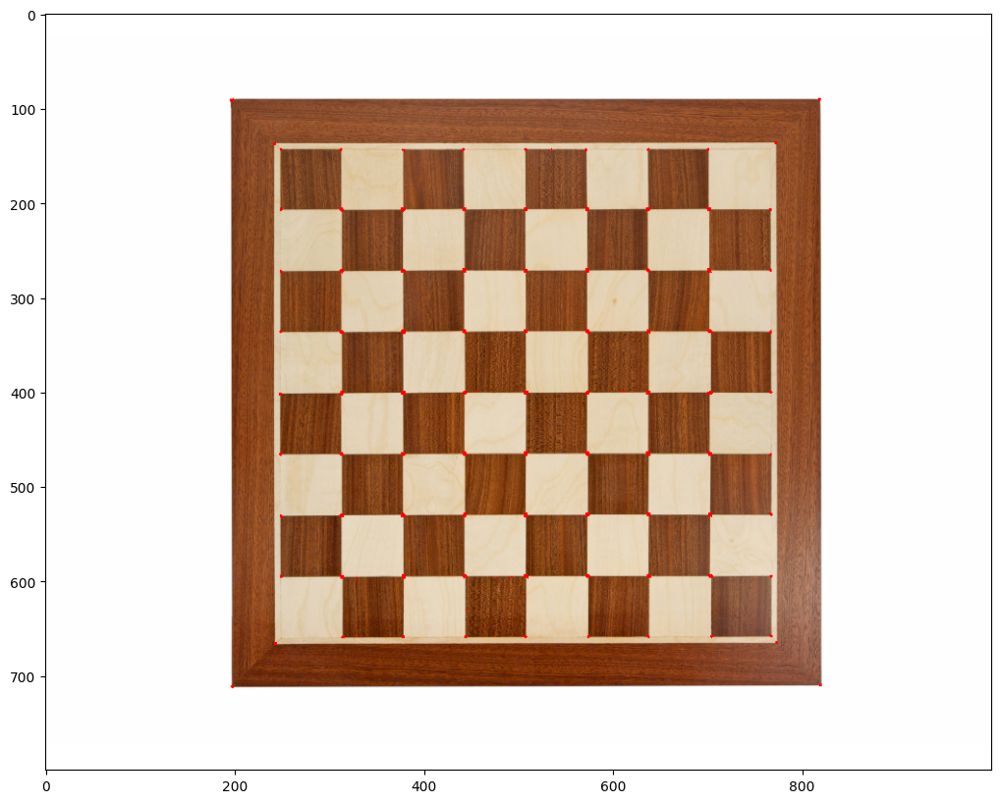

In [ ]:
# Load the input image
input_img = cv.imread('/content/drive/MyDrive/PCVK/chess-board.jpg')

# Convert the input image to grayscale
gray_img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)

# Apply the Harris corner detection algorithm
# The parameters are (input image, block size, Sobel kernel size, k)
# where block size is the neighborhood size for corner detection
# Sobel kernel size is the size of the Sobel operator kernel for gradient calculation
# k is a parameter in the Harris detector equation
dst = cv.cornerHarris(gray_img, 3, 1, 0.04)

# Convert the grayscale image to float32 for Harris corner detection
gray_img = np.float32(gray_img)

# Apply the Harris corner detection algorithm again
# The parameters are (grayscale image, block size, Sobel kernel size, k)
harris_output = cv.cornerHarris(gray_img, 2, 3, 3)

# Dilate the Harris corner detection result to mark the corners
harris_output = cv.dilate(harris_output, None)

# Threshold the input image based on the Harris corner detection result
# If the Harris corner detection value is above a certain threshold, mark it as a corner (red)
input_img[dst > 0.01 * dst.max()] = [0, 0, 255]

# Display the result
plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))


**b. Shi-Tomasi Detection**

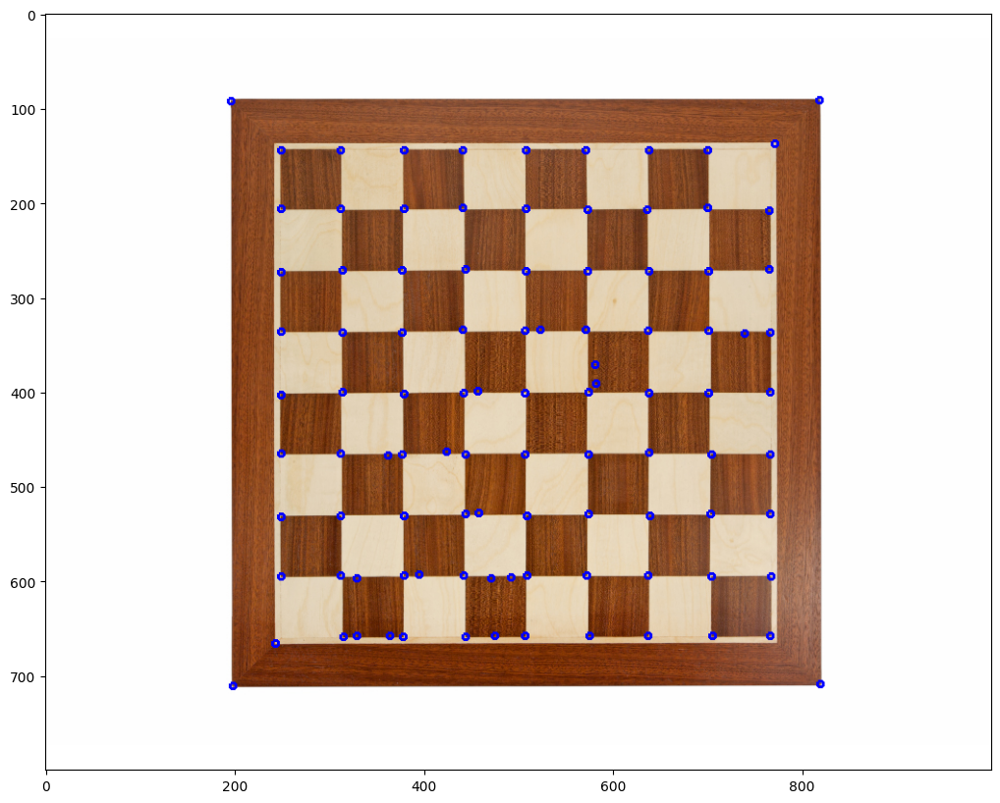

In [ ]:
# Load the input image
input_img = cv.imread('/content/drive/MyDrive/PCVK/chess-board.jpg')

# Convert the input image to grayscale
gray_img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)

# Use the Shi-Tomasi corner detection method (goodFeaturesToTrack)
# Parameters: (grayscale image, maxCorners, qualityLevel, minDistance)
corners = cv.goodFeaturesToTrack(gray_img, 100, 0.01, 10)

# Convert corner coordinates to integers
corners = np.int0(corners)

# Draw circles around the detected corners
for corner in corners:
    x, y = corner.ravel()
    cv.circle(input_img, (x, y), 3, 255, 2)

# Display the result
plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))


**5. Implement the Hough Transform method in OpenCV using the sudoku.jpg image. The
stages of the grid detection process are in accordance with those contained in the
theoretical review, resulting in the following output:**

Number of Hough lines: 33
Number of filtered lines: 20


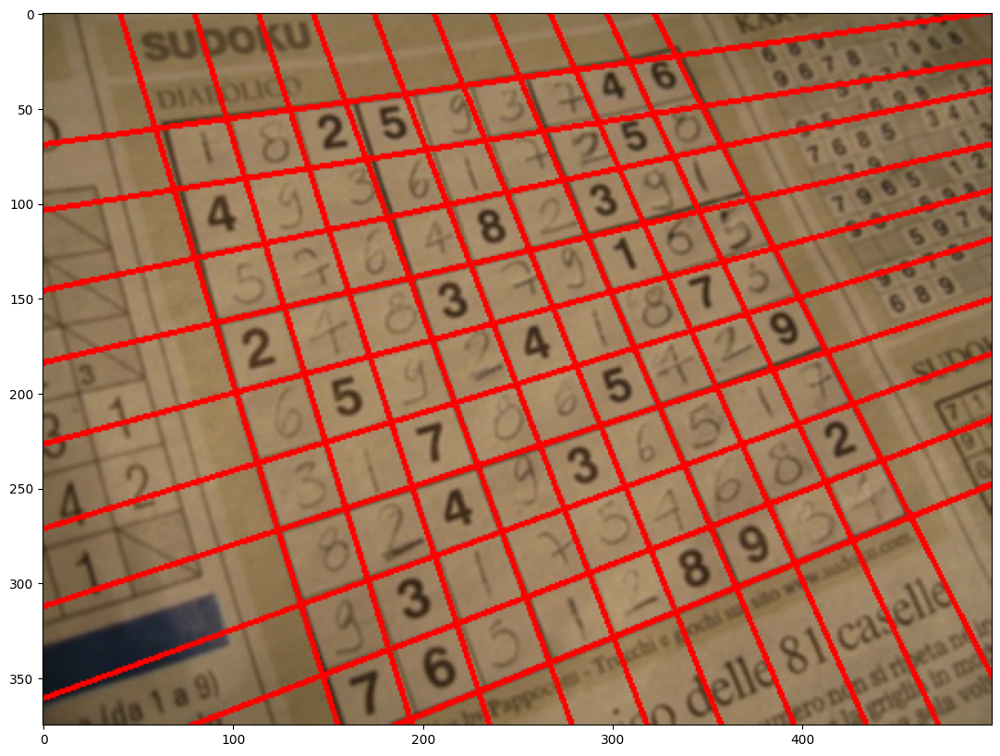

In [ ]:
# Load the input image
input_img = cv.imread('/content/drive/MyDrive/PCVK/sudoku.jpg')

# Convert the input image to grayscale
img_gray = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)

# Apply Canny edge detection to find edges in the image
edges = cv.Canny(img_gray, 90, 150, apertureSize=3)

# Dilate the edges to connect nearby edge points
kernel = np.ones((3, 3), np.uint8)
edges = cv.dilate(edges, kernel, iterations=1)

# Erode the edges to remove noise and fine-tune the edge map
kernel = np.ones((5, 5), np.uint8)
edges = cv.erode(edges, kernel, iterations=1)

# Apply Hough Transform to detect lines in the edge map
lines = cv.HoughLines(edges, 1, np.pi / 180, 150)

# Check if any lines were detected
if not lines.any():
    print('No lines were found')
    exit()

# Filter similar lines using a custom algorithm
rho_threshold = 15
theta_threshold = 0.1

similar_lines = {i: [] for i in range(len(lines))}
for i in range(len(lines)):
    for j in range(len(lines)):
        if i == j:
            continue
        rho_i, theta_i = lines[i][0]
        rho_j, theta_j = lines[j][0]
        if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
            similar_lines[i].append(j)

indices = [i for i in range(len(lines))]
indices.sort(key=lambda x: len(similar_lines[x]))

line_flags = len(lines) * [True]
for i in range(len(lines) - 1):
    if not line_flags[indices[i]]:
        continue
    for j in range(i + 1, len(lines)):
        if not line_flags[indices[j]]:
            continue
        rho_i, theta_i = lines[indices[i]][0]
        rho_j, theta_j = lines[indices[j]][0]
        if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
            line_flags[indices[j]] = False

print('Number of Hough lines:', len(lines))

filtered_lines = []

# Filter out lines based on similarity
if filter:
    for i in range(len(lines)):
        if line_flags[i]:
            filtered_lines.append(lines[i])

    print('Number of filtered lines:', len(filtered_lines))
else:
    filtered_lines = lines

# Draw the filtered lines on the original image
for line in filtered_lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))

    cv.line(input_img, (x1, y1), (x2, y2), (0, 0, 255), 2)

# Display the result image with the detected lines
plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))


**6. Implement the findContours () function in OpenCV for contour detection using the
laptop.jpg image, resulting in the following output:**

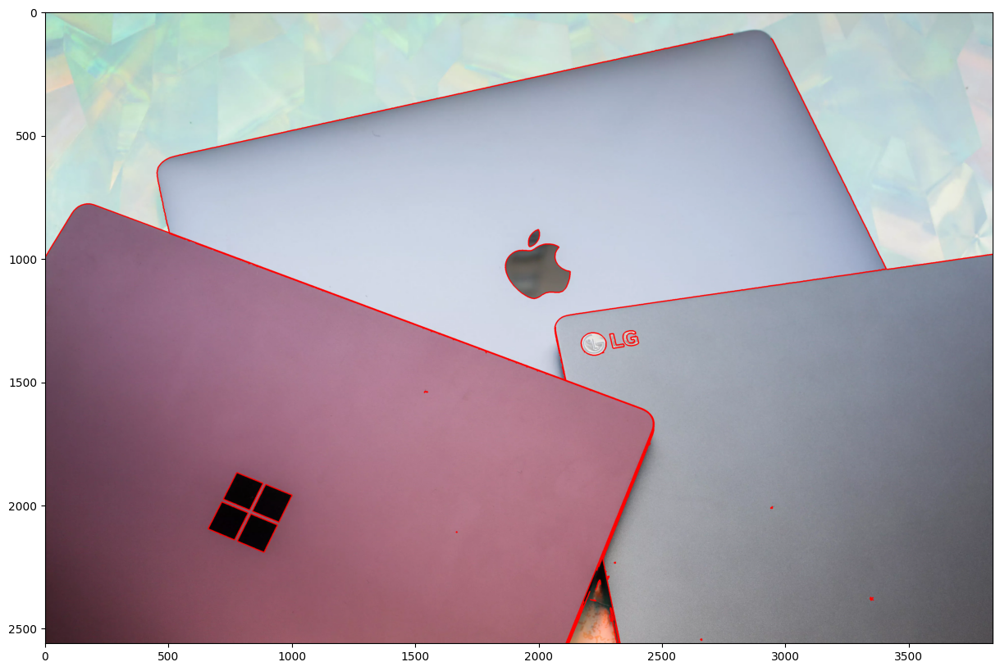

In [ ]:
# Load the input image
img = cv.imread('/content/drive/MyDrive/PCVK/laptop.jpg')

# Convert the input image to grayscale
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Apply Canny edge detection to find edges in the grayscale image
edged = cv.Canny(img_gray, 30, 200)

# Find contours in the edge-detected image
# The cv.RETR_EXTERNAL retrieves only the extreme outer contours
# The cv.CHAIN_APPROX_NONE stores all the contour points
contours, hierarchy = cv.findContours(edged, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

# Draw contours on the original image
# The contours are drawn in red (0, 0, 255) with a line thickness of 3
cv.drawContours(img, contours, -1, (0, 0, 255), 3)

# Display the result image with contours
plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))


----
##**⋰˚☆ MODULE BAHASA 11 ⋰˚☆**
###**MetodeDeteksiObjek: TemplateMatching,Edge Detection,CornerDetection,GridDetection ContourDetection**


**3. Implementasikan konsep template matching tanpa menggunakan library OpenCV
untuk multiple object, menggunakan gambar bahrain.jpg untuk citra masukan dan
bahrain-template.jpg sebagai citra template, sehingga menghasilkan output sebagai
berikut:**

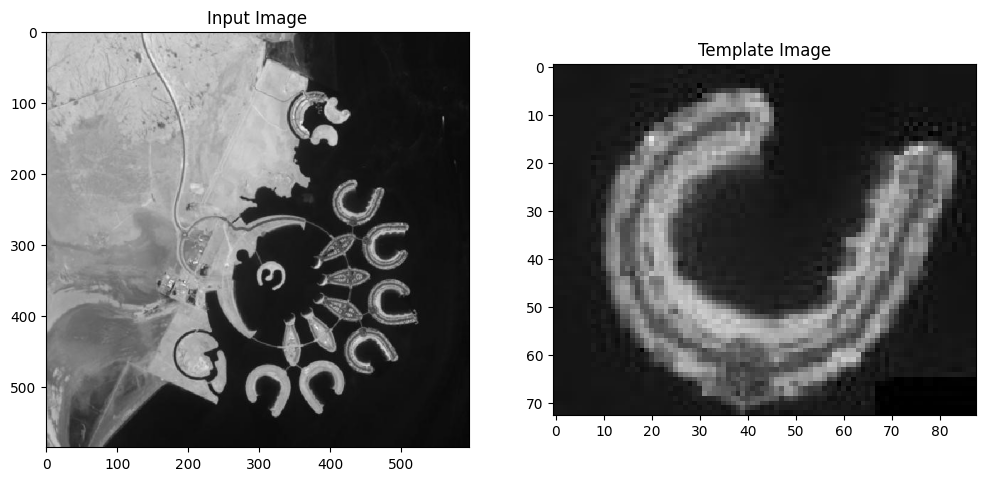

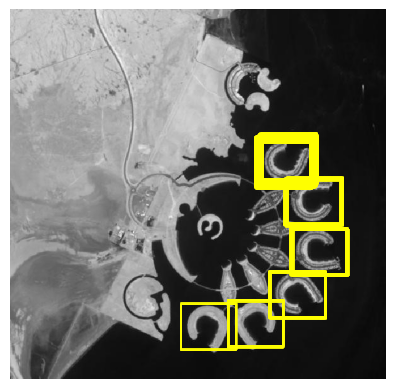

In [ ]:
# Import necessary libraries
from skimage.feature import match_template

# Read the input image and template image
img = cv.imread('/content/drive/MyDrive/PCVK/bahrain.jpg', 0)
template = cv.imread('/content/drive/MyDrive/PCVK/bahrain-template.jpg', 0)

# Display the input image and template side by side
f, axarr = plt.subplots(1, 2, figsize=(12, 8))
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), axarr[0].set_title("Input Image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("Template Image")

# Perform template matching
result = match_template(img, template)

# Set a threshold to determine matching results
threshold = 0.45
locations = np.where(result >= threshold)

# Plot the matching results on the input image
fig, ax = plt.subplots()
ax.imshow(img, cmap=plt.cm.gray)
ax.set_axis_off()
height, width = template.shape
for loc in zip(*locations[::-1]):
    rect = plt.Rectangle(loc, width, height, edgecolor='yellow', facecolor='none', linewidth=0.5)
    ax.add_patch(rect)

# Display the input image with highlighted matching regions
plt.show()

**4. Implementasikan metode Sobel Edge Detection, Canny Edge Detection, dan Laplacian
Edge Detection pada OpenCV dengan menggunakan gambar car-park.jpg, sehingga
menghasilkan luaran sebagai berikut:**

**a. Sobel Edge Detection**

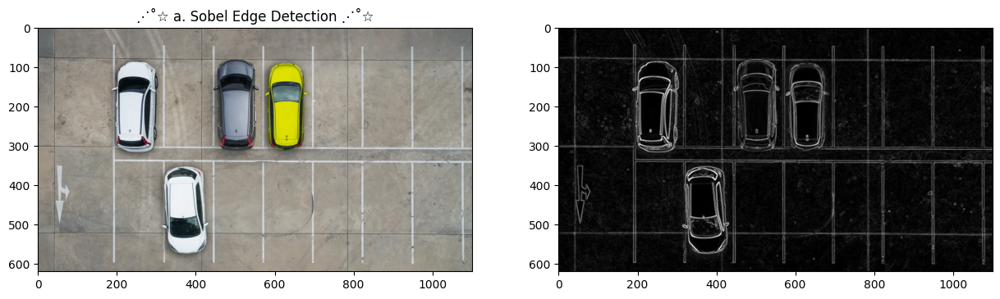

In [ ]:
# Read the image
original_image = cv.imread('/content/drive/MyDrive/PCVK/car-park.jpg')

# converting to gray scale
gray = cv.cvtColor(original_image, cv.COLOR_BGR2GRAY)

# remove noise
img = cv.GaussianBlur(gray, (3, 3), 0)

# obtaining a horizontal and vertical Sobel filtering of the image
img_sobelx = cv.Sobel(img, cv.CV_64F, 1, 0, ksize=3)
img_sobely = cv.Sobel(img, cv.CV_64F, 0, 1, ksize=3)

# image with both horizontal and vertical Sobel kernels applied
img_sobelxy = cv.addWeighted(cv.convertScaleAbs(img_sobelx), 0.5, cv.convertScaleAbs(img_sobely), 0.5, 0)

f, axarr = plt.subplots(1, 2, figsize=(15, 5))
plt.subplot(121), plt.imshow(cv.cvtColor(original_image, cv.COLOR_BGR2RGB))
axarr[0].imshow(cv.cvtColor(original_image, cv.COLOR_BGR2RGB))
axarr[0].set_title('⋰˚☆ a. Sobel Edge Detection ⋰˚☆')
plt.subplot(122), plt.imshow(img_sobelxy, cmap='gray')
axarr[1].imshow(cv.cvtColor(img_sobelxy, cv.COLOR_BGR2RGB))

**b. Canny Edge Detection**

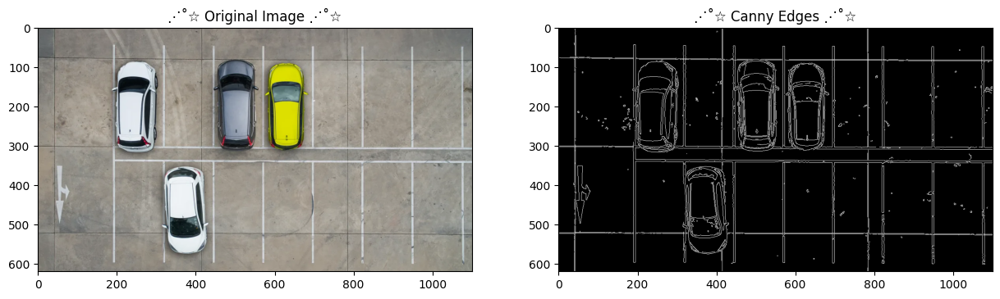

In [ ]:
# Read the image from the specified path
img = cv.imread('/content/drive/MyDrive/PCVK/car-park.jpg')

# Apply Canny edge detection with lower and upper thresholds of 100 and 200
edges = cv.Canny(img, 100, 200)

# Create a subplot with 1 row and 2 columns, setting the figure size
f, axarr = plt.subplots(1, 2, figsize=(15, 5))

# Plot the original image in the first subplot (left)
plt.subplot(121), plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('⋰˚☆ Original Image ⋰˚☆')  # Add a title to the subplot

# Plot the edges in the second subplot (right)
plt.subplot(122), plt.imshow(edges, cmap='gray')
axarr[1].imshow(edges, cmap='gray')
plt.title('⋰˚☆ Canny Edges ⋰˚☆')  # Add a title to the subplot

# Display the entire figure with both subplots
plt.show()


**c. Laplacian Edge Detection**

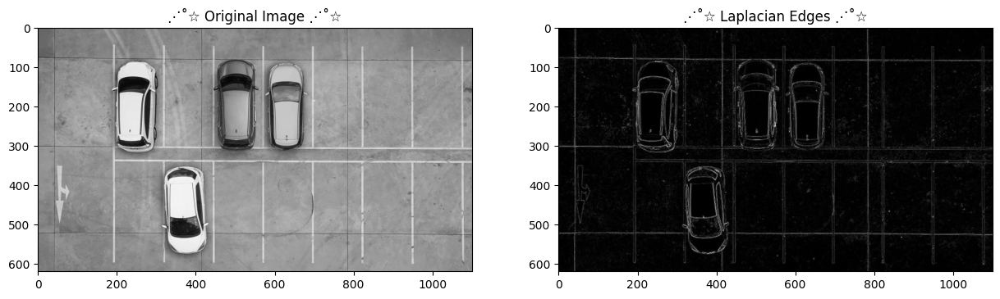

In [ ]:
# Read the image from the specified path
img = cv.imread('/content/drive/MyDrive/PCVK/car-park.jpg', cv.IMREAD_GRAYSCALE)  # Convert to grayscale

# Apply Laplacian edge detection
laplacian = cv.Laplacian(img, cv.CV_64F)

# Convert the result to uint8
laplacian = cv.convertScaleAbs(laplacian)

# Create a subplot with 1 row and 2 columns, setting the figure size
f, axarr = plt.subplots(1, 2, figsize=(15, 5))

# Plot the original image in the first subplot (left)
plt.subplot(121), plt.imshow(img, cmap='gray')
axarr[0].imshow(img, cmap='gray')
plt.title('⋰˚☆ Original Image ⋰˚☆')  # Add a title to the subplot

# Plot the Laplacian edges in the second subplot (right)
plt.subplot(122), plt.imshow(laplacian, cmap='gray')
axarr[1].imshow(laplacian, cmap='gray')
plt.title('⋰˚☆ Laplacian Edges ⋰˚☆')  # Add a title to the subplot

# Display the entire figure with both subplots
plt.show()


###**⋰˚☆ E. Pengayaan Materi KTP ⋰˚☆**

1. Siapkan file dataset, contoh pada praktik ini menggunakan Maftuchin Tuban

2. Muat 2 library berikut sebagai tahapan persiapan

In [59]:
# Import necessary libraries
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np

3. Tambahkan kode lokalisasi dataset dan lakukan pembacaan file name di dalam direktori
dataset tersebut


In [44]:
# Location of plate results
path_plate = "/content/drive/MyDrive/PCVK/KTP_More"

# Name of the file you want to process
name_file = "ktp3.png"

# Looping files in a directory
if name_file in os.listdir(path_plate):
     # Read full path of image file
     image_path = os.path.join(path_plate, name_file)

     # Read images using OpenCV
     src = cv2.imread(os.path.join(path_plate, name_file))

     # Make a copy of the image for processing purposes
     blurred = src.copy()

     # Make a copy of the image to grayscale (grayscale)
     gray = blurred.copy()

4. Masih pada looping file direktori, terapkan Gaussian Blur untuk setiap file supaya noise pickle
dapat direduksi


In [45]:
# Filtering
for i in range(10):
 blurred = cv2.GaussianBlur(src, (5, 5), 0.5)

5. Lakukan konversi grayscale untuk setiap hasil citra yang tereduksi noise dan lanjutkan dengan
binerisasi citra (thresholding)

Threshold: 168.0


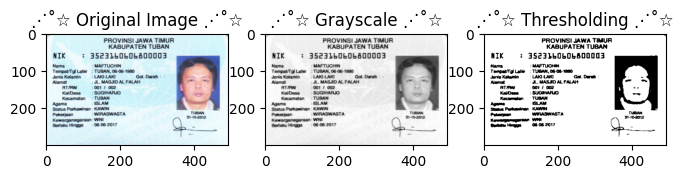

In [48]:
# Change to grayscale
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)

# Image binarization with thresholding (Otsu's thresholding)
ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print("Threshold:", ret)

# Displays the original image
plt.figure(figsize=(8, 8))
plt.subplot(131)
plt.imshow(cv2.cvtColor(src, cv2.COLOR_BGR2RGB))
plt.title('⋰˚☆ Original Image ⋰˚☆')

# Displays grayscale converted images
plt.subplot(132)
plt.imshow(gray, cmap='gray')
plt.title('⋰˚☆ Grayscale ⋰˚☆')

# Displays the binarized image
plt.subplot(133)
plt.imshow(bw, cmap='gray')
plt.title('⋰˚☆ Thresholding ⋰˚☆')

plt.show()

6. Terapkan morfologi untuk setiap citra yang telah mengalami binerisasi supaya setiap karakter
atau obyek tidak berhimpitan.


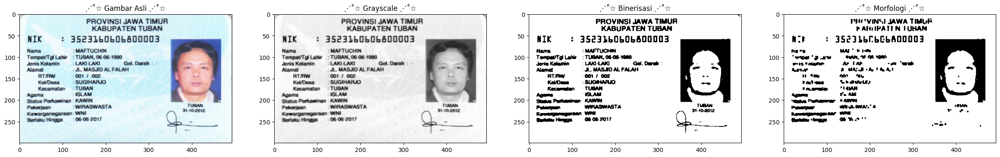

In [51]:
# Terapkan operasi morfologi (dilasi dan erosi)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
dilated = cv2.dilate(bw, kernel, iterations=1)
eroded = cv2.erode(dilated, kernel, iterations=1)

# Menampilkan gambar asli
plt.figure(figsize=(30, 30))
plt.subplot(141)
plt.imshow(cv2.cvtColor(src, cv2.COLOR_BGR2RGB))
plt.title('⋰˚☆ Gambar Asli ⋰˚☆')

# Menampilkan gambar hasil konversi grayscale
plt.subplot(142)
plt.imshow(gray, cmap='gray')
plt.title('⋰˚☆ Grayscale ⋰˚☆')

# Menampilkan gambar hasil binerisasi
plt.subplot(143)
plt.imshow(bw, cmap='gray')
plt.title('⋰˚☆ Binerisasi ⋰˚☆')

# Menampilkan gambar hasil dilasi
plt.subplot(144)
plt.imshow(eroded, cmap='gray')
plt.title('⋰˚☆ Morfologi ⋰˚☆')

plt.show()


7. Terapkan ekstraksi kontur untuk untuk mendapatkan semua kontur setiap karakter/obyek.
Kontur harus diseleksi berdasarkan ukuran dan rasio sebuah karakter. Karakter/obyek di
dalam KTP ini bervariasi ukuran dan rasionya, sehingga setiap karakter/obyek perlu
penanganan yang berbeda. Contoh pada praktik ini berfokus pada karakter yang seukuran
dengan NIK. Jika hasil ekstraksi kontur memperlihatkan hasil lain yaitu karakter lain
terdeteksi, hal tersebut wajar karena perlu optimize code dan preprocessing yang lebih baik
(karena hasil akuisisi setiap citra dapat berbeda).

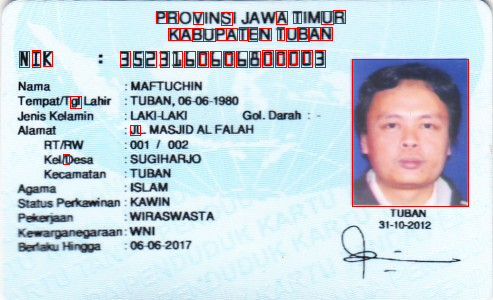

In [64]:
from google.colab.patches import cv2_imshow

# Read the KTP image
ktpImage = cv2.imread('/content/drive/MyDrive/PCVK/KTP_More/ktp4.png')

# Convert image to grayscale for edge detection
gray = cv2.cvtColor(ktpImage, cv2.COLOR_BGR2GRAY)

blurred = cv2.GaussianBlur(gray, (5, 5), 0)  # (5, 5) is the size of the Gaussian kernel, and 0 is the deviation

# Thresholding for creating binary images
ret, thresholded = cv2.threshold(blurred, 127, 255, cv2.THRESH_BINARY)

# Edge detection using Canny (you need to add the Canny operation here)
# For example: edges = cv.Canny(thresholded, 100, 200)

# Find contours on edge images
contours, hierarchy = cv2.findContours(thresholded, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on the original image
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
        cv2.rectangle(ktpImage, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 10 and w >= 5 and float(ras) <= 1:
        cv2.rectangle(ktpImage, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

# Display image with contours
cv2_imshow(ktpImage)
